#YOLOv8 Object Detection

## Environment preparation



In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
%pwd

'/content'

In [ ]:
%cd /content/drive/MyDrive/YOLOv8/1_object_detection

/content/drive/MyDrive/YOLOv8/1_object_detection


In [ ]:
#ultralytics' i indir
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.77 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.6/78.2 GB disk)


## Test / Prediction

In [ ]:
!yolo detect predict model=yolov8n.pt source='https://ultralytics.com/images/bus.jpg'


100% 6.25M/6.25M [00:00<00:00, 72.0MB/s]
Ultralytics YOLOv8.2.77 🚀 Python-3.10.12 torch-2.3.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

100% 134k/134k [00:00<00:00, 8.58MB/s]
image 1/1 /content/drive/MyDrive/YOLOv8/1_object_detection/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 359.1ms
Speed: 23.4ms preprocess, 359.1ms inference, 44.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


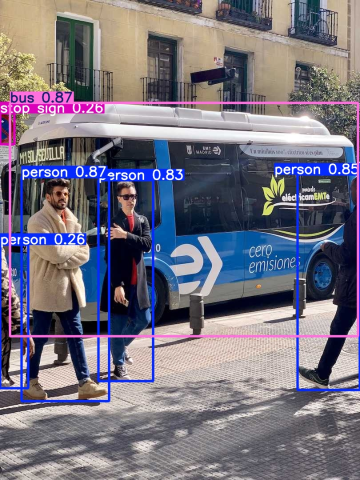

In [ ]:
import cv2
import imutils
from google.colab.patches import cv2_imshow
img=cv2.imread("/content/drive/MyDrive/YOLOv8/1_object_detection/runs/detect/predict/bus.jpg")
img=imutils.resize(img,width=360)
cv2_imshow(img)


0: 640x480 4 persons, 1 bus, 1 stop sign, 219.1ms
Speed: 5.8ms preprocess, 219.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


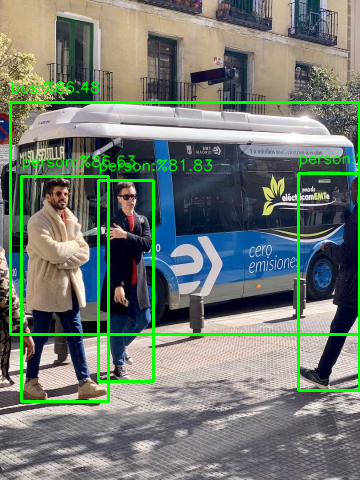

In [ ]:
import cv2
import imutils
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

font=cv2.FONT_HERSHEY_SIMPLEX
img_path="bus.jpg"
model_path="yolov8n.pt"

img=cv2.imread(img_path)
img=imutils.resize(img,width=360)
model=YOLO(model_path)

results=model(img)[0]

threshold=0.5
for result in results.boxes.data.tolist():
  x1,y1,x2,y2,score,class_id=result
  x1,y1,x2,y2,class_id=int(x1),int(y1),int(x2),int(y2),int(class_id)

  if score>threshold:
    cv2.rectangle(img,(x1,y1),(x2,y2),(0,255,0),2)

    class_name=results.names[class_id]
    score=score*100
    text=f"{class_name}:%{score:.2f}"

    cv2.putText(img,text,(x1,y1-10),font,0.5,(0,255,0),1,cv2.LINE_AA)
cv2_imshow(img)

## Brain Tumor Training

In [ ]:
!unzip data/brain_tumor_dataset.zip -d ./data

Archive:  data/brain_tumor_dataset.zip
   creating: ./data/brain_tumor_dataset/images/
   creating: ./data/brain_tumor_dataset/images/test/
  inflating: ./data/brain_tumor_dataset/images/test/101.jpg  
  inflating: ./data/brain_tumor_dataset/images/test/120.jpg  
  inflating: ./data/brain_tumor_dataset/images/test/127.jpg  
  inflating: ./data/brain_tumor_dataset/images/test/157.jpg  
  inflating: ./data/brain_tumor_dataset/images/test/16.jpg  
  inflating: ./data/brain_tumor_dataset/images/test/174.jpg  
  inflating: ./data/brain_tumor_dataset/images/test/18.jpg  
  inflating: ./data/brain_tumor_dataset/images/test/181.jpg  
  inflating: ./data/brain_tumor_dataset/images/test/205.jpg  
  inflating: ./data/brain_tumor_dataset/images/test/212.jpg  
  inflating: ./data/brain_tumor_dataset/images/test/217.jpg  
  inflating: ./data/brain_tumor_dataset/images/test/249.jpg  
  inflating: ./data/brain_tumor_dataset/images/test/266.jpg  
  inflating: ./data/brain_tumor_dataset/images/test/271.

In [ ]:
!yolo detect train data=data/config.yaml model=yolov8n.pt epochs=25 imgsz=640 workers=8 batch=8 device=0 name=yolov8_brain_tumor_detection


Ultralytics YOLOv8.2.77 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=data/config.yaml, epochs=25, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=yolov8_brain_tumor_detection, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=Tr

In [ ]:
#yarıda kalmış/kesilmiş eğitimi devam ettirme
!yolo detect train model=runs/detect/yolov8_brain_tumor_detection/weights/last.pt     resume=True

Ultralytics YOLOv8.2.77 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/yolov8_brain_tumor_detection/weights/last.pt, data=data/config.yaml, epochs=25, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=yolov8_brain_tumor_detection, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=runs/detect/yolov8_brain_tumor_detection/weights/last.pt, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, sa

##Brain Tumor Test / Detection

In [ ]:
!yolo detect predict model=runs/detect/yolov8_brain_tumor_detection/weights/best.pt source=inference save=True


Ultralytics YOLOv8.2.77 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs

image 1/77 /content/drive/MyDrive/YOLOv8/1_object_detection/inference/101.jpg: 640x640 1 Tumor, 7.7ms
image 2/77 /content/drive/MyDrive/YOLOv8/1_object_detection/inference/120.jpg: 640x640 1 Tumor, 7.4ms
image 3/77 /content/drive/MyDrive/YOLOv8/1_object_detection/inference/127.jpg: 640x640 1 Tumor, 7.5ms
image 4/77 /content/drive/MyDrive/YOLOv8/1_object_detection/inference/157.jpg: 640x640 1 Tumor, 7.8ms
image 5/77 /content/drive/MyDrive/YOLOv8/1_object_detection/inference/16.jpg: 640x640 1 Tumor, 7.5ms
image 6/77 /content/drive/MyDrive/YOLOv8/1_object_detection/inference/174.jpg: 640x640 1 Tumor, 7.4ms
image 7/77 /content/drive/MyDrive/YOLOv8/1_object_detection/inference/18.jpg: 640x640 2 Tumors, 7.6ms
image 8/77 /content/drive/MyDrive/YOLOv8/1_object_detection/inference/181.jpg: 640x640 1 Tumor, 7.4ms
image 9/77 /cont


0: 640x640 2 Tumors, 9.6ms
Speed: 5.8ms preprocess, 9.6ms inference, 556.2ms postprocess per image at shape (1, 3, 640, 640)


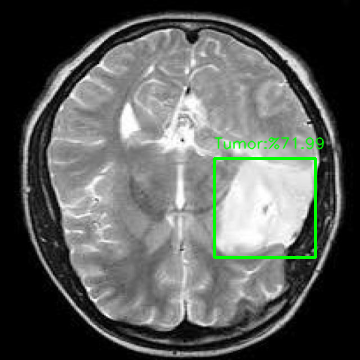

In [ ]:
import cv2
import imutils
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

font=cv2.FONT_HERSHEY_SIMPLEX
img_path="inference/747.jpg"
model_path="runs/detect/yolov8_brain_tumor_detection/weights/best.pt"

img=cv2.imread(img_path)
img=imutils.resize(img,width=360)
model=YOLO(model_path)

results=model(img)[0]

threshold=0.5
for result in results.boxes.data.tolist():
  x1,y1,x2,y2,score,class_id=result
  x1,y1,x2,y2,class_id=int(x1),int(y1),int(x2),int(y2),int(class_id)

  if score>threshold:
    cv2.rectangle(img,(x1,y1),(x2,y2),(0,255,0),2)

    class_name=results.names[class_id]
    score=score*100
    text=f"{class_name}:%{score:.2f}"

    cv2.putText(img,text,(x1,y1-10),font,0.5,(0,255,0),1,cv2.LINE_AA)
cv2_imshow(img)


0: 640x640 1 Tumor, 8.2ms
Speed: 2.8ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/120.jpg


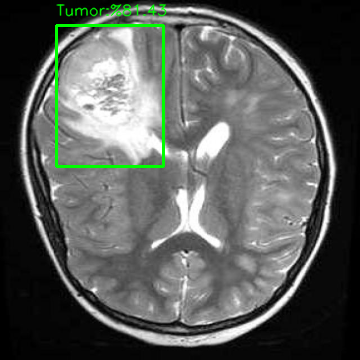


0: 640x640 1 Tumor, 7.7ms
Speed: 3.0ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/535.jpg


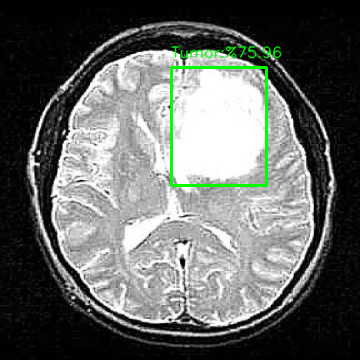


0: 640x640 1 Tumor, 11.1ms
Speed: 3.1ms preprocess, 11.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/489.jpg


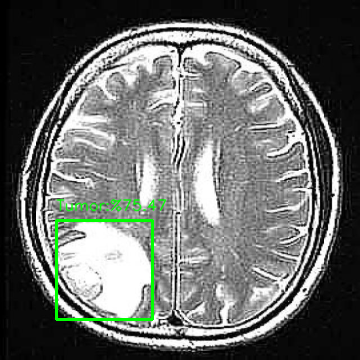


0: 640x640 1 Tumor, 8.9ms
Speed: 3.3ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/482.jpg


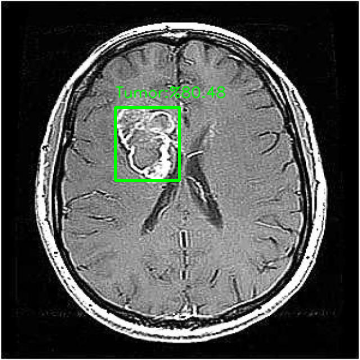


0: 640x640 1 Tumor, 8.0ms
Speed: 3.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/481.jpg


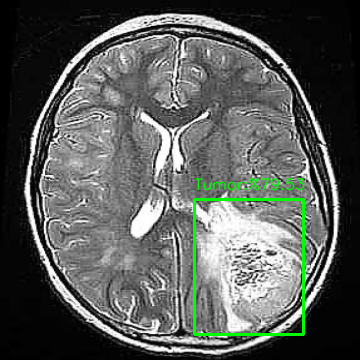


0: 640x640 1 Tumor, 7.8ms
Speed: 3.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/359.jpg


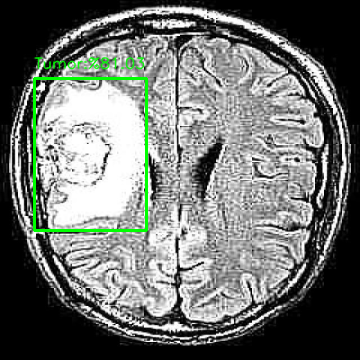


0: 640x640 1 Tumor, 8.6ms
Speed: 4.1ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/348.jpg


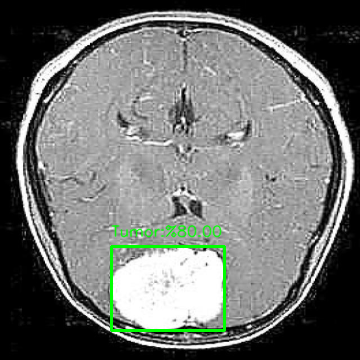


0: 640x640 1 Tumor, 8.7ms
Speed: 3.2ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/330.jpg


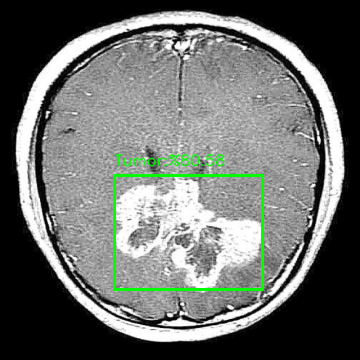


0: 640x640 1 Tumor, 23.7ms
Speed: 4.1ms preprocess, 23.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/301.jpg


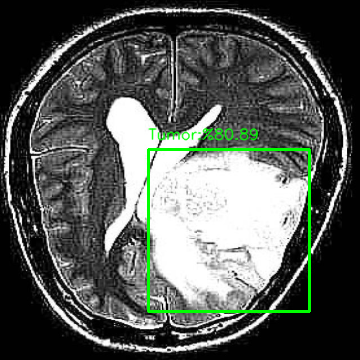


0: 640x640 1 Tumor, 9.7ms
Speed: 3.3ms preprocess, 9.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/357.jpg


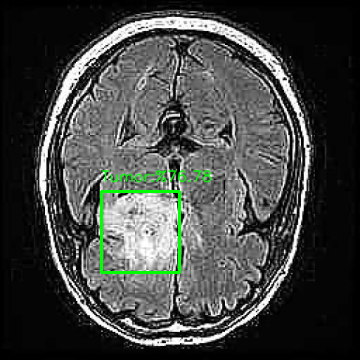


0: 640x640 2 Tumors, 12.8ms
Speed: 7.3ms preprocess, 12.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/351.jpg


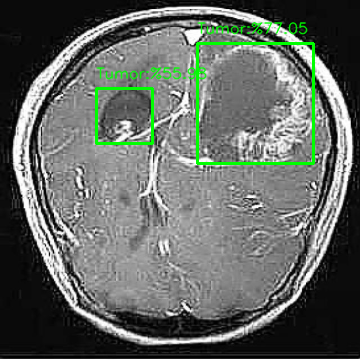


0: 640x640 1 Tumor, 18.3ms
Speed: 4.3ms preprocess, 18.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/455.jpg


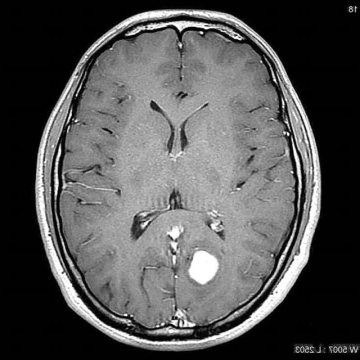


0: 640x640 1 Tumor, 14.9ms
Speed: 5.6ms preprocess, 14.9ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/473.jpg


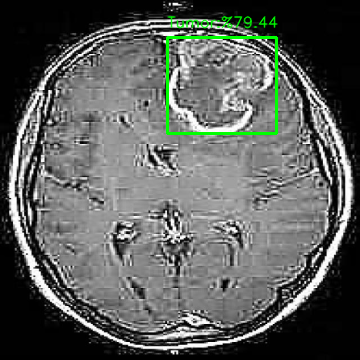


0: 640x640 1 Tumor, 8.5ms
Speed: 3.2ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/369.jpg


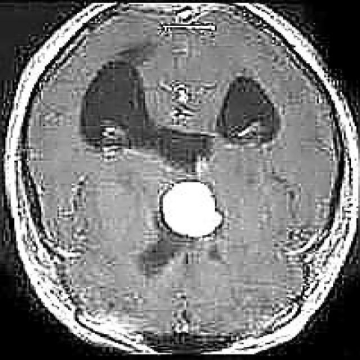


0: 640x640 1 Tumor, 9.3ms
Speed: 5.9ms preprocess, 9.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/397.jpg


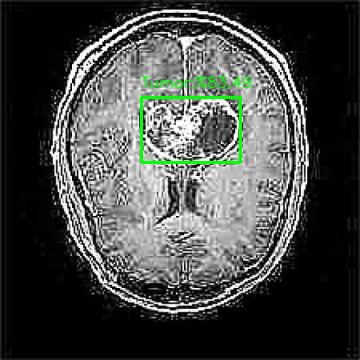


0: 640x640 1 Tumor, 11.1ms
Speed: 3.2ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/367.jpg


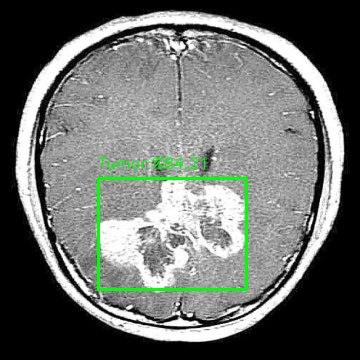


0: 640x640 1 Tumor, 13.1ms
Speed: 3.3ms preprocess, 13.1ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/394.jpg


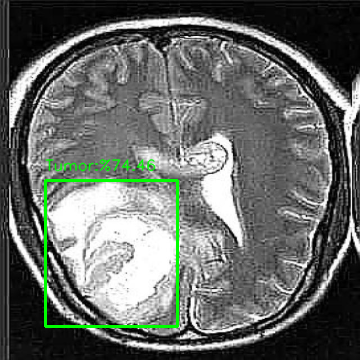


0: 640x640 1 Tumor, 12.7ms
Speed: 3.3ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/452.jpg


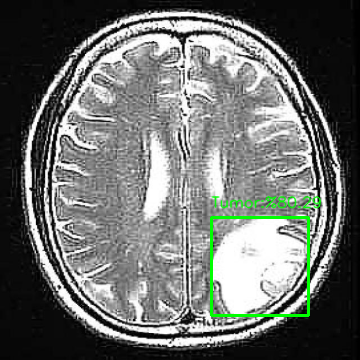


0: 640x640 1 Tumor, 14.0ms
Speed: 3.3ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/447.jpg


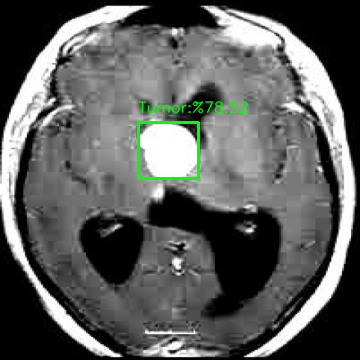


0: 640x640 1 Tumor, 13.8ms
Speed: 6.2ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/407.jpg


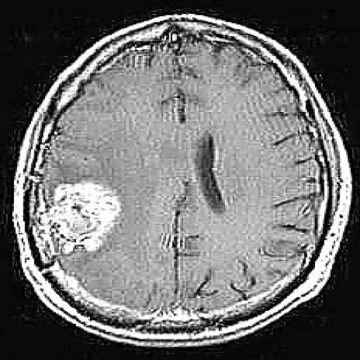


0: 640x640 1 Tumor, 9.9ms
Speed: 3.1ms preprocess, 9.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/422.jpg


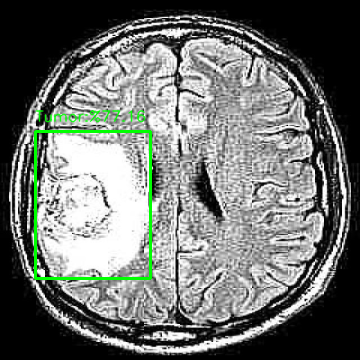


0: 640x640 1 Tumor, 36.3ms
Speed: 4.3ms preprocess, 36.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/507.jpg


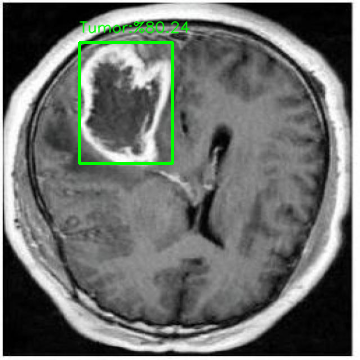


0: 640x640 1 Tumor, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 7.9ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/499.jpg


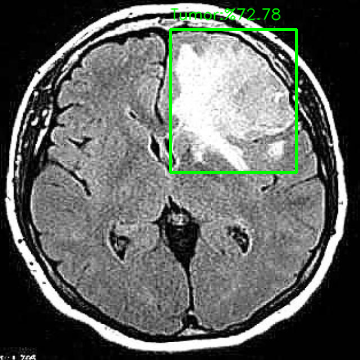


0: 640x640 1 Tumor, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/497.jpg


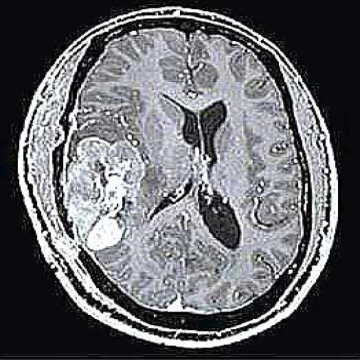


0: 640x640 1 Tumor, 21.5ms
Speed: 3.4ms preprocess, 21.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/491.jpg


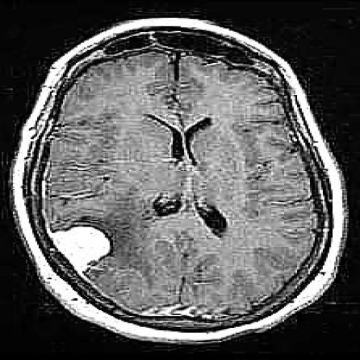


0: 640x640 1 Tumor, 19.0ms
Speed: 3.2ms preprocess, 19.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/505.jpg


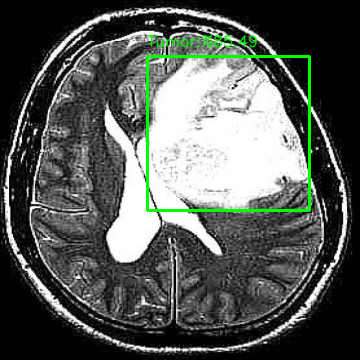


0: 640x640 1 Tumor, 16.5ms
Speed: 3.3ms preprocess, 16.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/488.jpg


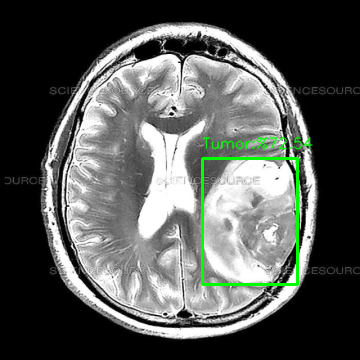


0: 640x640 1 Tumor, 16.0ms
Speed: 3.1ms preprocess, 16.0ms inference, 6.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/451.jpg


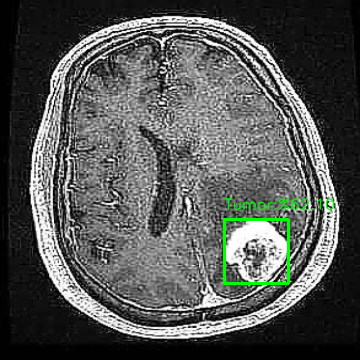


0: 640x640 1 Tumor, 26.6ms
Speed: 5.2ms preprocess, 26.6ms inference, 8.9ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/287.jpg


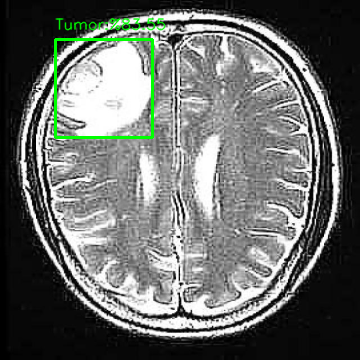


0: 640x640 1 Tumor, 19.5ms
Speed: 3.2ms preprocess, 19.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/275.jpg


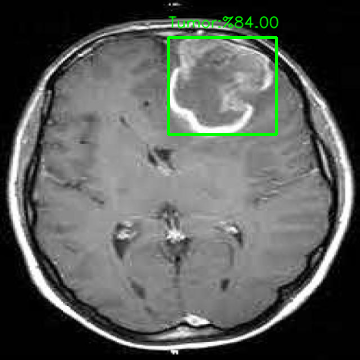


0: 640x640 1 Tumor, 18.0ms
Speed: 5.3ms preprocess, 18.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/293.jpg


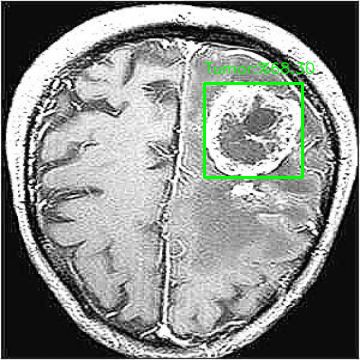


0: 640x640 1 Tumor, 8.7ms
Speed: 4.3ms preprocess, 8.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/271.jpg


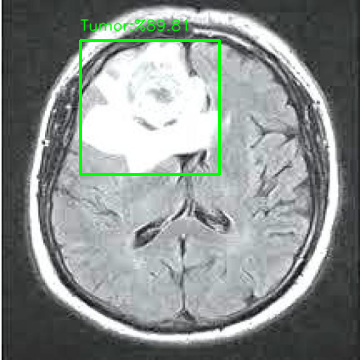


0: 640x640 (no detections), 12.5ms
Speed: 3.2ms preprocess, 12.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/266.jpg


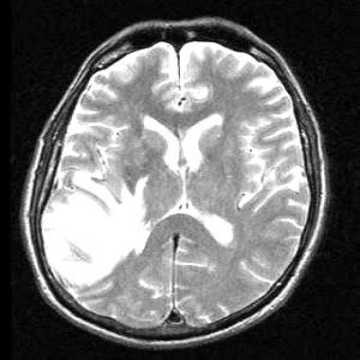


0: 640x640 (no detections), 8.2ms
Speed: 3.1ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/212.jpg


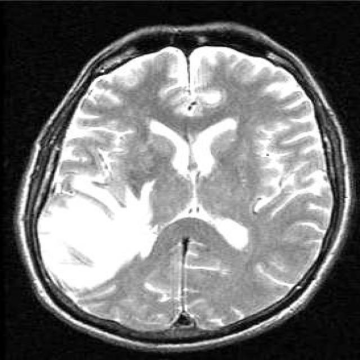


0: 640x640 1 Tumor, 9.4ms
Speed: 3.2ms preprocess, 9.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/249.jpg


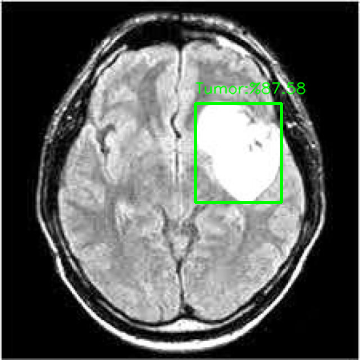


0: 640x640 2 Tumors, 12.0ms
Speed: 3.1ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/205.jpg


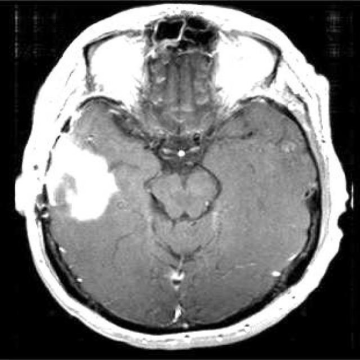


0: 640x640 1 Tumor, 8.1ms
Speed: 3.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/217.jpg


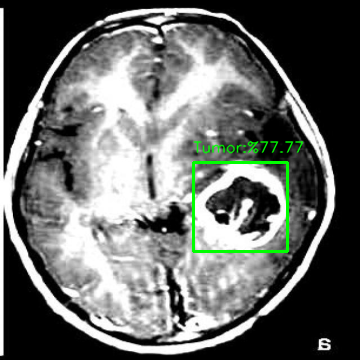


0: 640x640 1 Tumor, 11.3ms
Speed: 4.3ms preprocess, 11.3ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/181.jpg


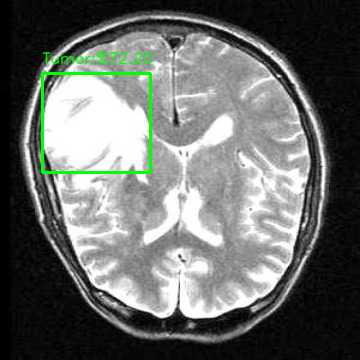


0: 640x640 1 Tumor, 10.4ms
Speed: 3.3ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/174.jpg


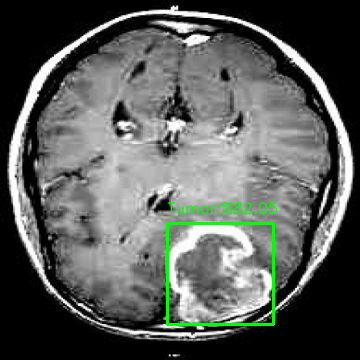


0: 640x640 2 Tumors, 16.2ms
Speed: 3.2ms preprocess, 16.2ms inference, 5.9ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/157.jpg


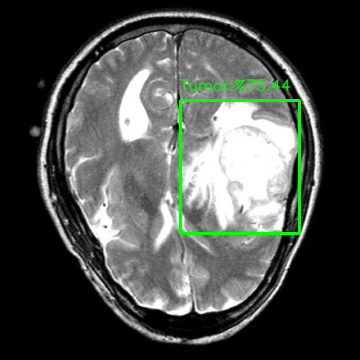


0: 640x640 1 Tumor, 9.3ms
Speed: 3.2ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/127.jpg


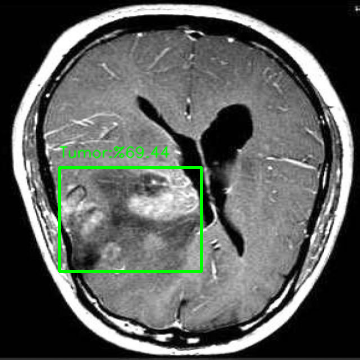


0: 640x640 1 Tumor, 10.6ms
Speed: 3.2ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/101.jpg


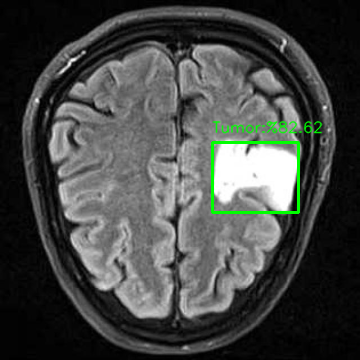


0: 640x640 1 Tumor, 9.0ms
Speed: 3.3ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/86.jpg


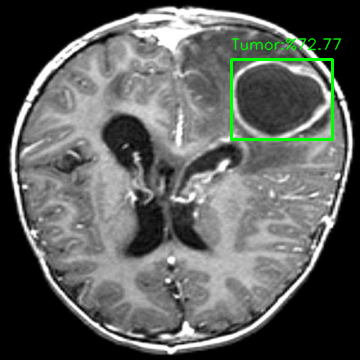


0: 640x640 1 Tumor, 11.3ms
Speed: 3.2ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/80.jpg


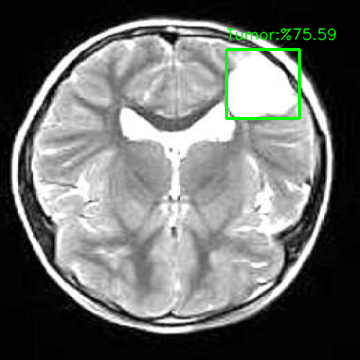


0: 640x640 3 Tumors, 12.8ms
Speed: 3.2ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/63.jpg


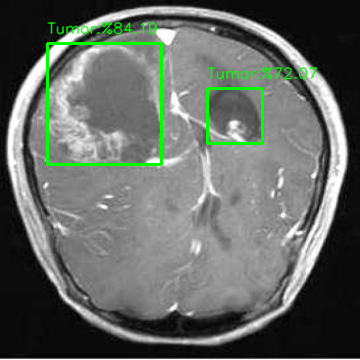


0: 640x640 1 Tumor, 11.5ms
Speed: 3.3ms preprocess, 11.5ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/62.jpg


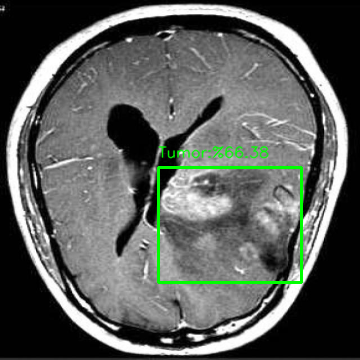


0: 640x640 1 Tumor, 12.6ms
Speed: 11.2ms preprocess, 12.6ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/16.jpg


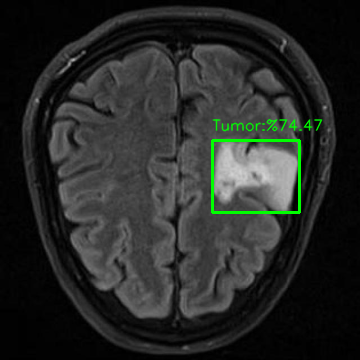


0: 640x640 2 Tumors, 17.6ms
Speed: 3.3ms preprocess, 17.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/18.jpg


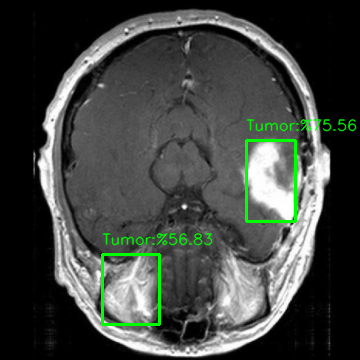


0: 640x640 (no detections), 19.4ms
Speed: 3.2ms preprocess, 19.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/580.jpg


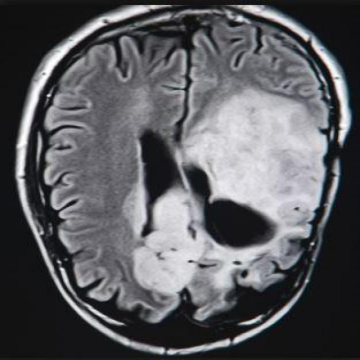


0: 640x640 1 Tumor, 16.0ms
Speed: 3.2ms preprocess, 16.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/574.jpg


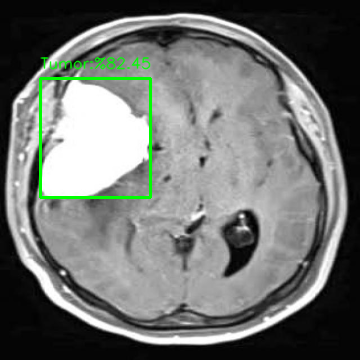


0: 640x640 1 Tumor, 8.4ms
Speed: 3.1ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/763.jpg


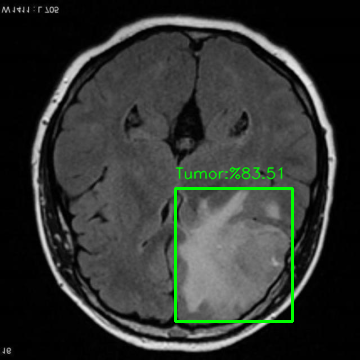


0: 640x640 1 Tumor, 12.5ms
Speed: 3.7ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/758.jpg


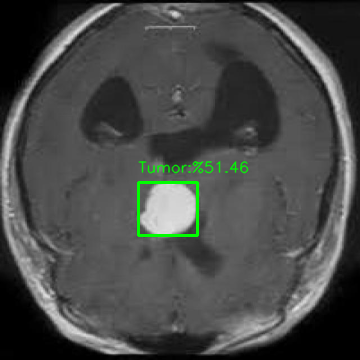


0: 640x640 1 Tumor, 12.2ms
Speed: 3.1ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/674.jpg


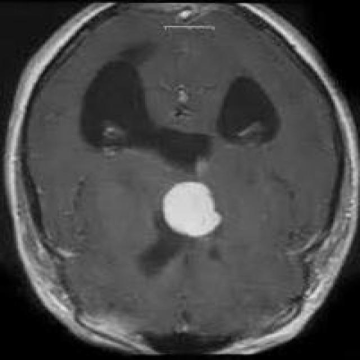


0: 640x640 1 Tumor, 7.9ms
Speed: 3.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/625.jpg


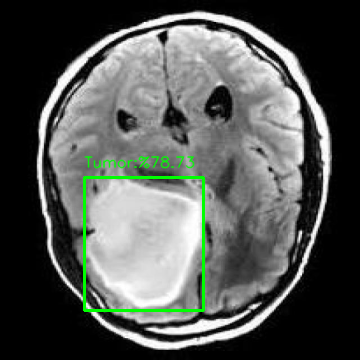


0: 640x640 3 Tumors, 8.5ms
Speed: 3.2ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/718.jpg


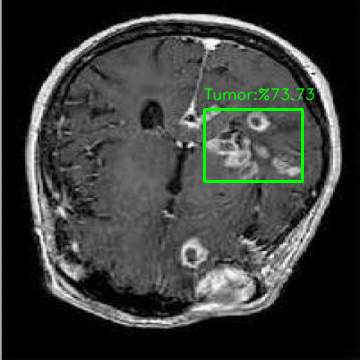


0: 640x640 1 Tumor, 12.9ms
Speed: 3.0ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/654.jpg


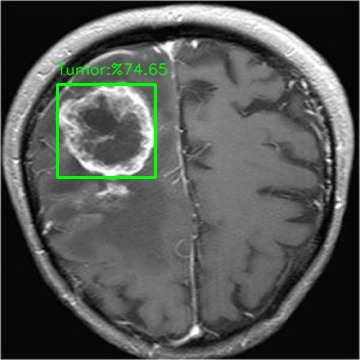


0: 640x640 1 Tumor, 13.1ms
Speed: 4.3ms preprocess, 13.1ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/614.jpg


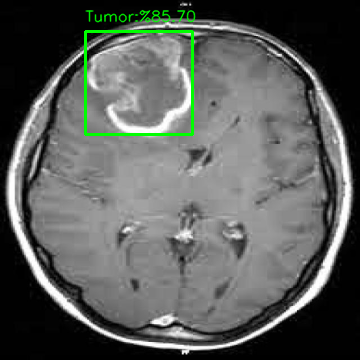


0: 640x640 1 Tumor, 13.0ms
Speed: 6.3ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/583.jpg


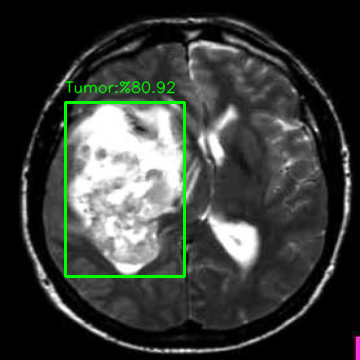


0: 640x640 1 Tumor, 15.1ms
Speed: 4.3ms preprocess, 15.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/601.jpg


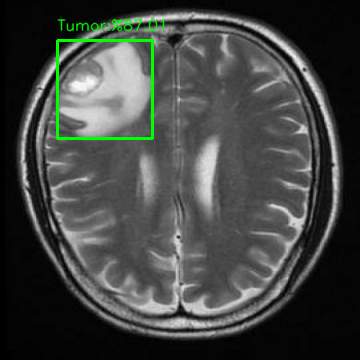


0: 640x640 1 Tumor, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/595.jpg


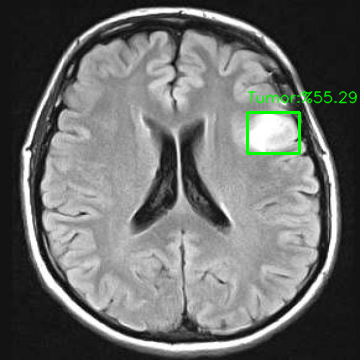


0: 640x640 1 Tumor, 9.0ms
Speed: 3.6ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/748.jpg


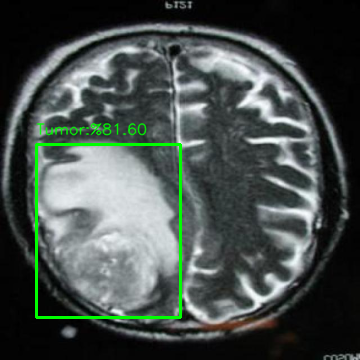


0: 640x640 1 Tumor, 14.4ms
Speed: 3.2ms preprocess, 14.4ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/734.jpg


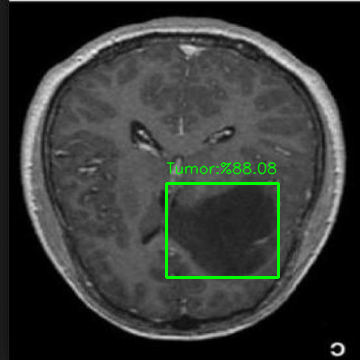


0: 640x640 1 Tumor, 18.7ms
Speed: 3.1ms preprocess, 18.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/719.jpg


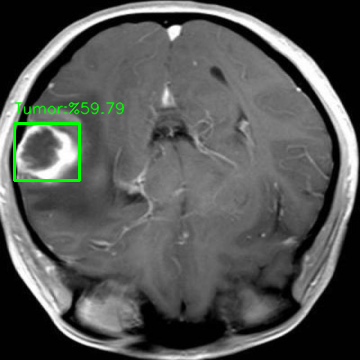


0: 640x640 1 Tumor, 9.5ms
Speed: 3.2ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/578.jpg


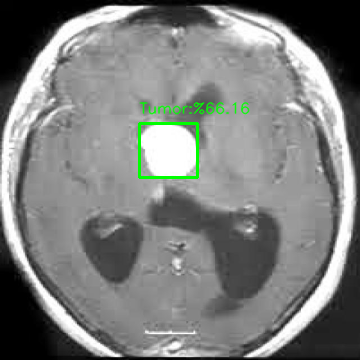


0: 640x640 1 Tumor, 9.2ms
Speed: 3.1ms preprocess, 9.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/689.jpg


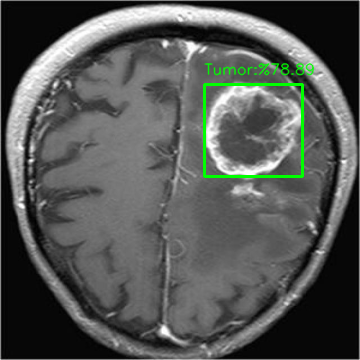


0: 640x640 2 Tumors, 10.0ms
Speed: 3.1ms preprocess, 10.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/753.jpg


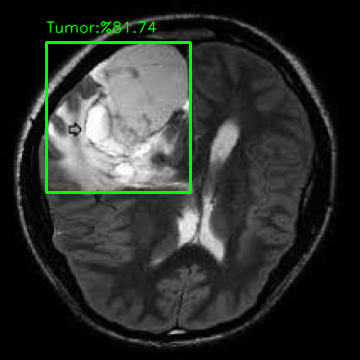


0: 640x640 1 Tumor, 10.9ms
Speed: 3.3ms preprocess, 10.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/695.jpg


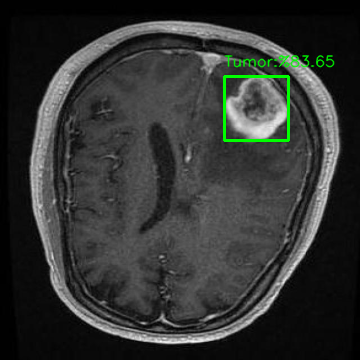


0: 640x640 2 Tumors, 14.7ms
Speed: 3.2ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/747.jpg


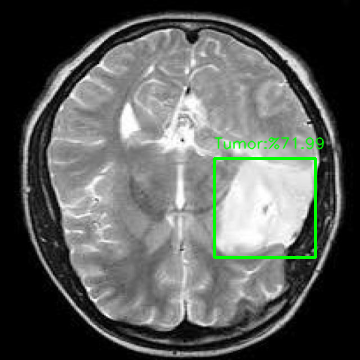


0: 640x640 1 Tumor, 17.9ms
Speed: 3.3ms preprocess, 17.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/746.jpg


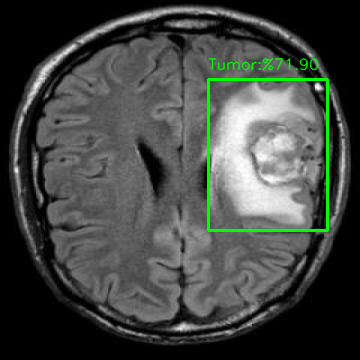


0: 640x640 2 Tumors, 21.0ms
Speed: 3.2ms preprocess, 21.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/676.jpg


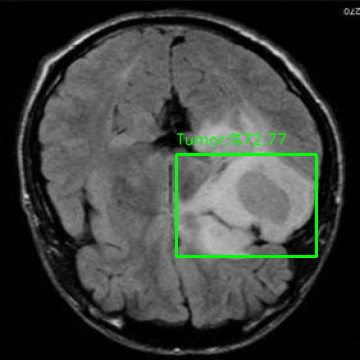


0: 640x640 1 Tumor, 18.2ms
Speed: 3.1ms preprocess, 18.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/673.jpg


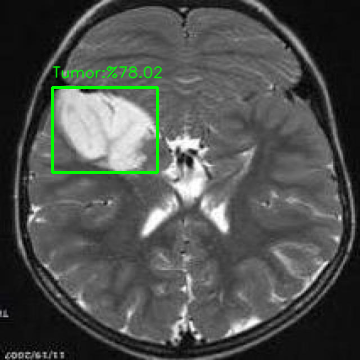


0: 640x640 1 Tumor, 16.9ms
Speed: 3.1ms preprocess, 16.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/554.jpg


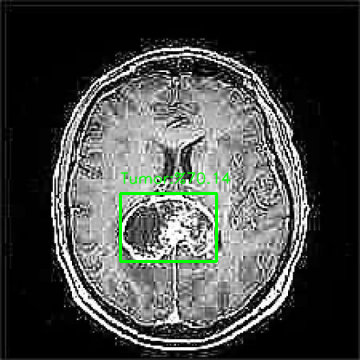


0: 640x640 1 Tumor, 12.9ms
Speed: 3.0ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/553.jpg


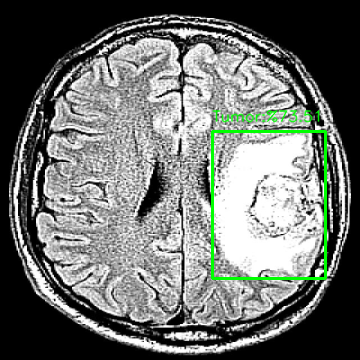


0: 640x640 1 Tumor, 11.9ms
Speed: 7.1ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/530.jpg


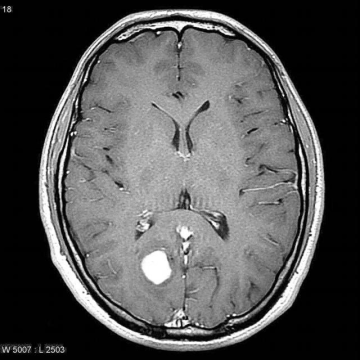


0: 640x640 1 Tumor, 9.2ms
Speed: 7.2ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/576.jpg


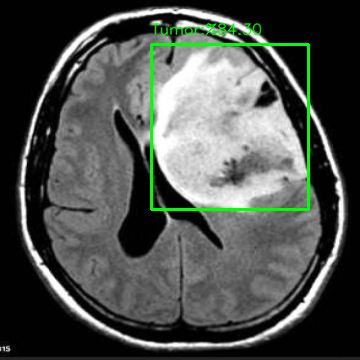


0: 640x640 (no detections), 15.9ms
Speed: 3.2ms preprocess, 15.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/540.jpg


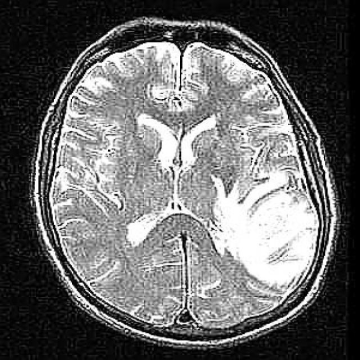


0: 640x640 1 Tumor, 12.8ms
Speed: 3.2ms preprocess, 12.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
Results for image: inference/564.jpg


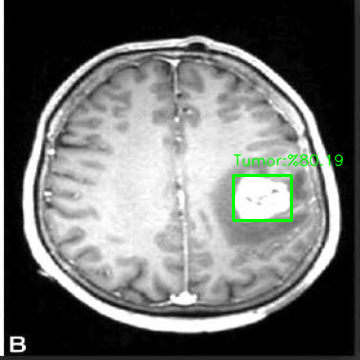

In [ ]:
import os
import glob
import cv2
import imutils
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

model_path = "runs/detect/yolov8_brain_tumor_detection/weights/best.pt"
image_folder = "inference/"
font = cv2.FONT_HERSHEY_SIMPLEX

model = YOLO(model_path)

image_files = glob.glob(os.path.join(image_folder, "*.*"))

threshold = 0.5

for img_path in image_files:
    img = cv2.imread(img_path)
    img = imutils.resize(img, width=360)

    results = model(img)[0]

    for result in results.boxes.data.tolist():
        x1, y1, x2, y2, score, class_id = result
        x1, y1, x2, y2, class_id = int(x1), int(y1), int(x2), int(y2), int(class_id)

        if score > threshold:
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

            class_name = results.names[class_id]
            score = score * 100
            text = f"{class_name}:%{score:.2f}"

            cv2.putText(img, text, (x1, y1 - 10), font, 0.5, (0, 255, 0), 1, cv2.LINE_AA)

    print(f"Results for image: {img_path}")
    cv2_imshow(img)
